### Instalación de las dependencias

In [1]:
!pip install spacy
!pip install gensim
!python -m spacy download es_core_news_sm
!pip install textblob

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.9/12.9 MB 53.8 MB/s eta 0:00:00
✔ Download and installation successful
You can now load the package via spacy.load('es_core_news_sm')
⚠ Restart to reload dependencies
If you are in a Jupyter or Colab notebook, you may need to restart Python in
order to load all the package's dependencies. You can do this by selecting the
'Restart kernel' or 'Restart runtime' option.


### Instalaciones de Librerías

In [2]:
import os
import re
import spacy
import nltk
import unicodedata
import pandas as pd
import matplotlib.pyplot as plt
from textblob import TextBlob
from nltk.corpus import wordnet as wn
from nltk.stem import WordNetLemmatizer
from wordcloud import WordCloud
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import classification_report, accuracy_score
import sqlite3
from transformers import pipeline


### Cargamos el contenido de las resoluciones desde la DB

In [3]:
db_path = "/content/normativa_dgcye.db"

# Conexión a la base de datos
conn = sqlite3.connect(db_path)
cursor = conn.cursor()

# Seleccionar todas las filas de la tabla 'archivos' y cargarlas en una lista
cursor.execute('SELECT * FROM archivos ORDER BY id DESC')
filas = cursor.fetchall()

# Cerrar la conexión a la base de datos
conn.close()

# Crear un DataFrame de pandas con las filas obtenidas
# Asumiendo que conoces los nombres de las columnas en tu tabla 'archivos'
column_names = [column[0] for column in cursor.description]  # Obtener nombres de las columnas si están disponibles
resoluciones_df = pd.DataFrame(filas, columns=column_names)


### Limpieza del texto

In [4]:
# Función para limpiar el texto y eliminar acentos
def limpiar_texto(texto):
    # Convertir a minúsculas y normalizar para eliminar acentos
    texto = texto.lower()
    texto = unicodedata.normalize('NFD', texto)
    texto = texto.encode('ascii', 'ignore').decode('utf-8')  # Eliminar caracteres no ASCII (acentos)

    # Eliminar números irrelevantes (no completos como años)
    texto = re.sub(r'\b(19[5-9]\d|20[0-2]\d|2030)\b', '', texto)
    # Eliminar URLs
    texto = re.sub(r'https?://\S+|www\.\S+', ' ', texto)
    # Eliminar caracteres especiales
    texto = re.sub(r'[^a-zA-Z0-9\s]', ' ', texto)
    # Eliminar palabras aisladas de 1 o 2 letras que puedan generar fragmentos en el análisis
    texto = re.sub(r'\b\w{1,2}\b', '', texto)
    # Eliminar espacios extras
    texto = re.sub(r'\s+', ' ', texto).strip()

    return texto

# Aplicar la limpieza
resoluciones_df['contenido'] = resoluciones_df['contenido'].apply(limpiar_texto)

# Mostrar los primeros 1000 caracteres de las resoluciones limpias
texto_limpio = ' '.join(resoluciones_df['contenido'])
print(texto_limpio[:1000])

resolucion 15395 plata diciembre visto que las secretarias inspeccion poseen categorizacion considerando que art las leyes 10579 10743 establece escalafon docente general incluyendo inciso con los items vii viii los cargos secretaria inspeccion primera segunda tercera categoria respectivam ente que categorizacion vigente fue establecida por resolucion 3576 que por resolucion 293 mantuvo solo efecto liquidacion haberes que consecuencia resulta indispensable establecer pautas conforme las normas legales vigentes que tal fin han estudiado los antecedentes normativos sobre tema que direccion gestion capacitacion educativa opone realizar categorizacion conforme cantidad cargos docentes del distrito que subsecretaria educacion avala propuesta por ello directora general cultura educacion resuelve articulo establecer que categorizacion las secretarias inspeccion realizaran acuerdo con cantidad cargos docentes del distrito conforme escala que especifica categoria cantidad cargos docentes mas 35

##PREPROCESAMIENTO (Lematización y Stopwords)

In [5]:
nltk.download('wordnet')
nlp = spacy.load("es_core_news_sm")

[nltk_data] Downloading package wordnet to /root/nltk_data...


In [6]:
from spacy.lang.es.stop_words import STOP_WORDS

# Cargar el modelo de spaCy
nlp = spacy.load("es_core_news_sm")

# Definir palabras personalizadas como stopwords
stopwords_personalizadas = [
    "ejecutivo", "visto", "considerando", "expediente", "dirección", "general", "de", "cultura", "y",
    "educación", "la", "plata", "provincia", "buenos", "aires", "direccion", "educacion", "establecer",
    "resolución", "resolucion", "presente"
]

# Agregar palabras personalizadas a la lista de stopwords
for word in stopwords_personalizadas:
    nlp.Defaults.stop_words.add(word)

# Unir las stopwords personalizadas con las stopwords de spaCy
stopwords_personalizadas_set = set(stopwords_personalizadas).union(STOP_WORDS)

# Verificar que se hayan agregado correctamente
for word in stopwords_personalizadas:
    if word in nlp.Defaults.stop_words:
        print(f"{word} es stopword")
    else:
        print(f"{word} no está en la lista de stopwords.")



ejecutivo es stopword
visto es stopword
considerando es stopword
expediente es stopword
dirección es stopword
general es stopword
de es stopword
cultura es stopword
y es stopword
educación es stopword
la es stopword
plata es stopword
provincia es stopword
buenos es stopword
aires es stopword
direccion es stopword
educacion es stopword
establecer es stopword
resolución es stopword
resolucion es stopword
presente es stopword


In [7]:
# Función optimizada de lematización y eliminación de stopwords
def procesar_resoluciones(texto):
    doc = nlp(texto)
    # Lematizar y eliminar stopwords personalizadas, puntuación y espacios
    palabras_procesadas = [
        token.lemma_ for token in doc
        if not token.is_stop and not token.is_punct and not token.is_space
    ]
    return ' '.join(palabras_procesadas)

# Procesar todas las resoluciones limpias
resoluciones_df['contenido_procesado'] = resoluciones_df['contenido'].apply(procesar_resoluciones)

# Verificar algunas filas del resultado
print(resoluciones_df[['contenido', 'contenido_procesado']].head())


                                           contenido  \
0  resolucion 15395 plata diciembre visto que las...   
1  provincia buenos aires poder ejecutivo plata 1...   
2  visto que direccion educacion inicial detectad...   
3  provincia buenos aires poder ejecutivo plata v...   
4  reolucion 13229 plata dic visto expediente n58...   

                                 contenido_procesado  
0  15395 diciembre secretaria inspeccion poseer c...  
1  100ct n1425 experiencia recogido aconsejar con...  
2  inicial detectado demanda jardines infant cara...  
3  580 1692954 primaria solicitar apruebir pauta ...  
4  reolucion 13229 dic n5805 2864556 docente garc...  


In [14]:
cv = CountVectorizer(ngram_range=(2, 2)).fit(resoluciones_df['contenido_procesado'])
print("Tamaño de vocabulario: {}".format(len(cv.vocabulary_)))
print("Vocabulario:\n{}".format(cv.get_feature_names_out()))
print("Vocabulary content:\n {}".format(cv.vocabulary_))

Tamaño de vocabulario: 565730
Vocabulario:
['000 000' '000 000000' '000 00070' ... 'ún art' 'ún cargo' 'ús oral']
Vocabulary content:
 {'15395 diciembre': 3984, 'diciembre secretaria': 174763, 'secretaria inspeccion': 490570, 'inspeccion poseer': 302613, 'poseer categorizacion': 420880, 'categorizacion art': 91982, 'art ley': 59374, 'ley 10579': 330364, '10579 10743': 1677, '10743 establecer': 1796, 'establecer escalafon': 229581, 'escalafon docente': 218328, 'docente incluir': 189615, 'incluir inciso': 291818, 'inciso items': 291432, 'items vii': 317456, 'vii viii': 556350, 'viii cargo': 556360, 'cargo secretaria': 89083, 'inspeccion categoria': 302459, 'categoria respectivam': 91894, 'respectivam ente': 477257, 'ente categorizacion': 213187, 'categorizacion vigente': 91995, 'vigente establecer': 555968, 'establecer 3576': 229420, '3576 293': 9145, '293 mantener': 7594, 'mantener efecto': 341549, 'efecto liquidacion': 200033, 'liquidacion haber': 333610, 'haber consecuenciar': 274872,

## Dividir en conjuntos de entrenamiento (80%) y testeo (20%)

In [9]:
train_df, test_df = train_test_split(resoluciones_df, test_size=0.2, random_state=42)

# Mostrar los tamaños de los conjuntos
print("Tamaño del conjunto de entrenamiento:", train_df.shape[0])
print("Tamaño del conjunto de testeo:", test_df.shape[0])

Tamaño del conjunto de entrenamiento: 599
Tamaño del conjunto de testeo: 150


### ANÁLISIS con BoW

In [62]:
# Inicializar el vectorizador BoW
vectorizer_BoW = CountVectorizer(max_features=1000, ngram_range=(2, 2))  # Ajustar ngram según sea necesario
X = vectorizer_BoW.fit_transform(train_df['contenido_procesado'])

# Convertir el resultado a un DataFrame
df_bow = pd.DataFrame(X.toarray(), columns=vectorizer_BoW.get_feature_names_out())
print(df_bow.head())

   100 000  11612 resultar  13688 resultar  2536 direc  3er ano  4to ano  \
0        0               0               0           0        0        0   
1        0               0               0           0        0        0   
2        0               1               0           0        0        0   
3        0               1               0           0        0        0   
4        0               0               0           0        0        0   

   577 228  5802 577  abuso sexual  academico institucional  ...  \
0        0         0             0                        0  ...   
1        0         0             0                        0  ...   
2        0         0             0                        0  ...   
3        0         0             0                        2  ...   
4        0         0             0                        0  ...   

   viable dictado  vicepresidente consejo  vida cotidiano  vigente materia  \
0               0                       0               

In [63]:
# Graficar las 20 palabras más frecuentes
palabras_importantes_bow = df_bow.sum().sort_values(ascending=False)
print(palabras_importantes_bow.head(20))

direc cion               936
diseno curricular        768
sistema educativo        570
servicio educativo       499
tecnico profesional      495
espacio curricular       468
formacion profesional    456
provincial gestion       432
carga horario            424
privado reconocido       408
articulo registrar       398
universidad nacional     384
cion ner                 382
titulo docente           377
nivel modalidad          370
articulo determinar      362
capacitacion docente     361
consejo escolar          354
acto administrativo      354
ner cult                 343
dtype: int64


In [64]:
# Definir un umbral para las palabras clave
umbral = 0.3  # Ajustar

# Crear un diccionario para almacenar los temas
temas = {}

# Agrupar palabras clave por temas
for i, row in df_bow.iterrows():
    palabras_importantes = row[row > umbral].index.tolist()  # Obtener palabras clave con conteo > umbral
    for palabra in palabras_importantes:
        if palabra not in temas:
            temas[palabra] = []  # Inicializa una lista para cada palabra clave
        temas[palabra].append(i)  # Agregar el índice de la resolución al tema correspondiente

print("Palabras clave por tema:")
for indice, palabras in temas.items():
    # Convertir cada elemento en 'palabras' a string
    palabras_str = [str(palabra) for palabra in palabras]
    print(f'Tema: {", ".join(palabras_str)}; Palabras clave: {indice}')

Palabras clave por tema:
Tema: 0, 1, 3, 5, 8, 11, 12, 16, 19, 20, 22, 24, 26, 33, 34, 36, 38, 39, 41, 44, 45, 46, 47, 51, 53, 57, 59, 60, 65, 70, 73, 75, 79, 92, 95, 102, 103, 105, 110, 112, 113, 125, 131, 138, 139, 149, 151, 152, 158, 159, 163, 166, 168, 170, 172, 173, 174, 177, 185, 188, 189, 190, 194, 199, 200, 203, 207, 208, 211, 213, 214, 219, 224, 226, 227, 234, 236, 238, 242, 251, 253, 255, 257, 258, 265, 271, 275, 276, 280, 293, 295, 301, 303, 306, 307, 309, 311, 312, 313, 318, 319, 321, 324, 326, 328, 330, 344, 347, 350, 353, 356, 357, 359, 362, 364, 365, 368, 372, 374, 378, 383, 387, 388, 393, 394, 403, 405, 408, 409, 411, 413, 416, 418, 424, 426, 428, 431, 432, 446, 453, 456, 457, 458, 460, 461, 465, 467, 470, 473, 474, 476, 479, 481, 483, 487, 488, 493, 494, 495, 499, 500, 505, 509, 510, 511, 513, 519, 527, 529, 534, 535, 537, 539, 541, 542, 543, 550, 555, 556, 557, 570, 575, 577, 579, 580, 584, 585, 588, 590, 594, 596, 597; Palabras clave: acto administrativo
Tema: 0, 2, 3

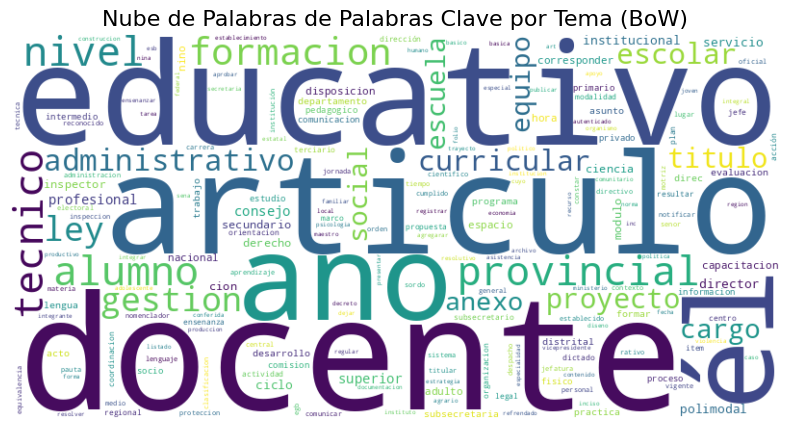

In [65]:
# Crear un string para la nube de palabras, asegurando que las claves sean de tipo str
nube_texto = ' '.join([str(palabra) for palabra in temas.keys()])  # Unir las palabras clave

# Generar la nube de palabras
nube_palabras = WordCloud(width=800, height=400, background_color='white', colormap='viridis').generate(nube_texto)

# Mostrar la nube de palabras
plt.figure(figsize=(10, 5))
plt.imshow(nube_palabras, interpolation='bilinear')
plt.axis('off')  # No mostrar los ejes
plt.title('Nube de Palabras de Palabras Clave por Tema (BoW)', fontsize=16)
plt.show()

##ANÁLISIS con TF-IDF

In [66]:
# Inicializar el vectorizador TF-IDF
vectorizer_tfidf = TfidfVectorizer(max_features=1000, ngram_range=(2,2))
X_tfidf = vectorizer_tfidf.fit_transform(train_df['contenido_procesado'])

# Convertir a DataFrame
df_tfidf = pd.DataFrame(X_tfidf.toarray(), columns=vectorizer_tfidf.get_feature_names_out())
#print(df_tfidf.head())


In [ ]:
# Mostrar las palabras más importantes
palabras_importantes_tfidf = df_tfidf.sum().sort_values(ascending=False)
#print(palabras_importantes_tfidf.head(10))

agregarar copia autenticado            21.093168
articulo registrar desglosado          17.435877
registrar desglosado archivo           17.370655
lugar agregarar copia                  17.122516
director resolver articulo             17.023221
archivo coordinacion administrativo    15.318713
desglosado archivo coordinacion        15.175306
copia autenticado comunicar            15.100050
articulo registrar disposicion         13.881663
trayecto tecnico profesional           13.843027
dtype: float64


In [67]:
# Definir un umbral para las palabras clave
umbral = 0.3  # Ajusta según sea necesario

# Crear un diccionario para almacenar las palabras clave por tema
temas_tfidf = {}

# Agrupar palabras clave por temas
for i, row in df_tfidf.iterrows():
    palabras_importantes = row[row > umbral].index.tolist()  # Obtener palabras clave con puntuación TF-IDF > umbral
    temas_tfidf[i] = palabras_importantes  # Asociar el índice de la resolución con sus palabras clave

# Imprimir las palabras por tema
#print("Palabras clave por tema:")
#for indice, palabras in temas_tfidf.items():
 #   print(f'Tema {indice}: Palabras clave: {", ".join(palabras)}')


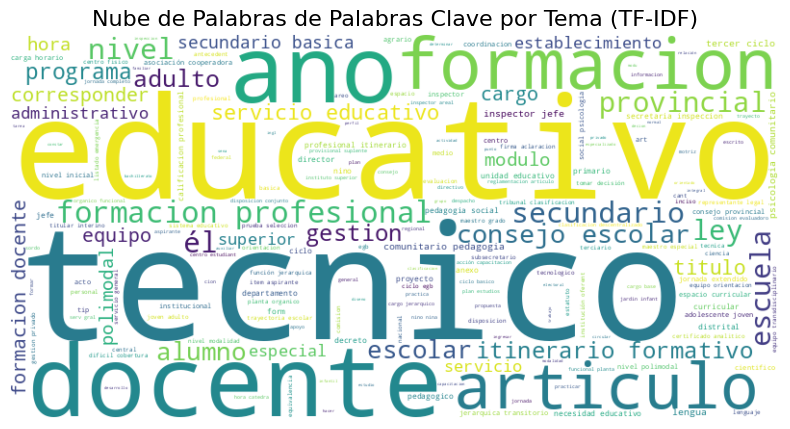

In [68]:
# Crear un string para la nube de palabras
nube_texto_tfidf = ' '.join([palabra for palabras in temas_tfidf.values() for palabra in palabras])  # Unir todas las palabras clave

# Generar la nube de palabras
nube_palabras_tfidf = WordCloud(width=800, height=400, background_color='white', colormap='viridis').generate(nube_texto_tfidf)

# Mostrar la nube de palabras
plt.figure(figsize=(10, 5))
plt.imshow(nube_palabras_tfidf, interpolation='bilinear')
plt.axis('off')  # No mostrar los ejes
plt.title('Nube de Palabras de Palabras Clave por Tema (TF-IDF)', fontsize=16)
plt.show()

### Clustering sobre BoW y TF-IDF

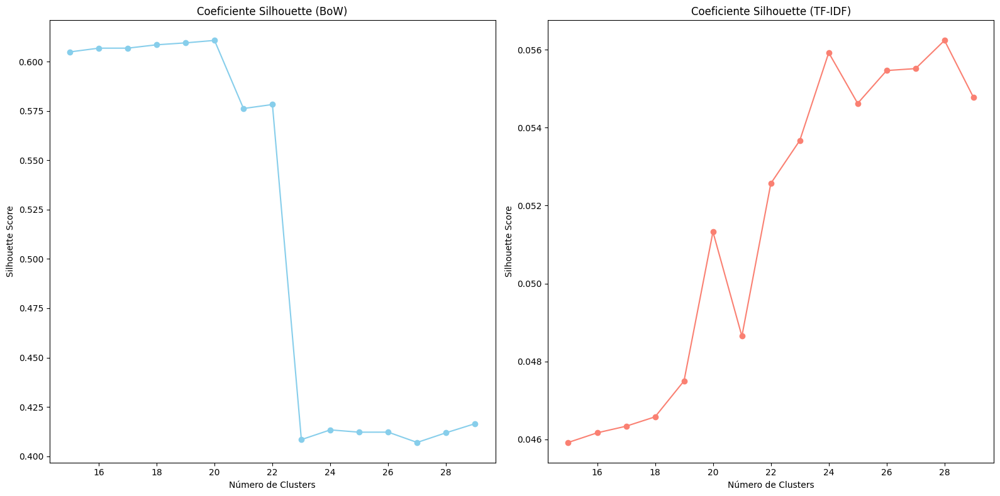

In [88]:
# Lista para almacenar los coeficientes de silhouette
silhouette_scores_bow = []
silhouette_scores_tfidf = []
min_k = 15
max_k = 30
# Probar diferentes números de clusters
for k in range(min_k, max_k):  # El coeficiente silhouette no se define para k=1
    # K-means para BoW
    kmeans_bow = KMeans(n_clusters=k, random_state=42)
    clusters_bow = kmeans_bow.fit_predict(X)
    silhouette_scores_bow.append(silhouette_score(X, clusters_bow))

    # K-means para TF-IDF
    kmeans_tfidf = KMeans(n_clusters=k, random_state=42)
    clusters_tfidf = kmeans_tfidf.fit_predict(X_tfidf)
    silhouette_scores_tfidf.append(silhouette_score(X_tfidf, clusters_tfidf))

# Graficar el coeficiente de silhouette para BoW y TF-IDF
plt.figure(figsize=(16, 8))

# Silhouette score para BoW
plt.subplot(1, 2, 1)
plt.plot(range(min_k, max_k), silhouette_scores_bow, marker='o', color='skyblue')
plt.title('Coeficiente Silhouette (BoW)')
plt.xlabel('Número de Clusters')
plt.ylabel('Silhouette Score')

# Silhouette score para TF-IDF
plt.subplot(1, 2, 2)
plt.plot(range(min_k, max_k), silhouette_scores_tfidf, marker='o', color='salmon')
plt.title('Coeficiente Silhouette (TF-IDF)')
plt.xlabel('Número de Clusters')
plt.ylabel('Silhouette Score')

plt.tight_layout()
plt.show()


In [70]:
# Número de clusters
clusters_bow = 7
clusters_itf=20
# K-means para Bag of Words
kmeans_bow = KMeans(n_clusters=clusters_itf, random_state=42)
clusters_bow = kmeans_bow.fit_predict(X)

# K-means para TF-IDF
kmeans_tfidf = KMeans(n_clusters=clusters_itf, random_state=42)
clusters_tfidf = kmeans_tfidf.fit_predict(X_tfidf)


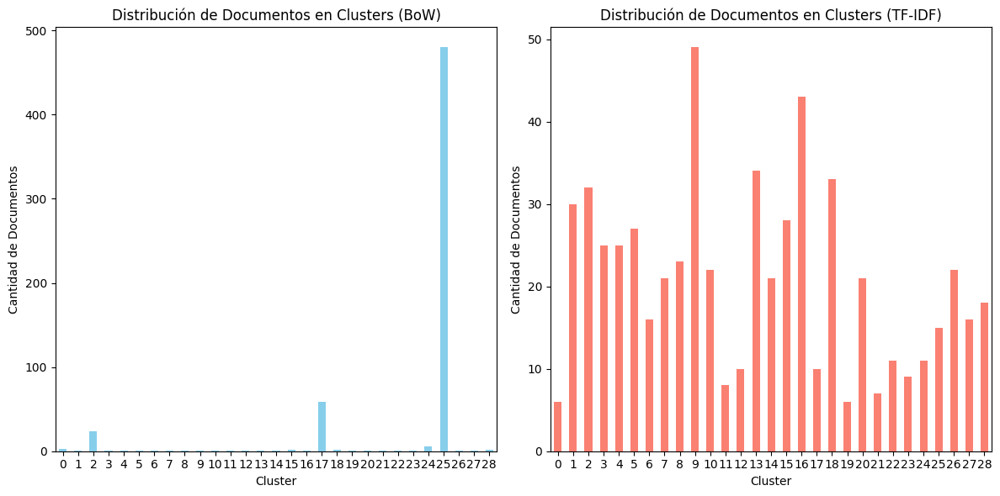

In [89]:
# Contar la cantidad de documentos en cada cluster para BoW
conteo_clusters_bow = pd.Series(clusters_bow).value_counts().sort_index()

# Contar la cantidad de documentos en cada cluster para TF-IDF
conteo_clusters_tfidf = pd.Series(clusters_tfidf).value_counts().sort_index()

# Graficar los resultados
plt.figure(figsize=(12, 6))

# Gráfico para BoW
plt.subplot(1, 2, 1)
conteo_clusters_bow.plot(kind='bar', color='skyblue')
plt.title('Distribución de Documentos en Clusters (BoW)')
plt.xlabel('Cluster')
plt.ylabel('Cantidad de Documentos')
plt.xticks(rotation=0)

# Gráfico para TF-IDF
plt.subplot(1, 2, 2)
conteo_clusters_tfidf.plot(kind='bar', color='salmon')
plt.title('Distribución de Documentos en Clusters (TF-IDF)')
plt.xlabel('Cluster')
plt.ylabel('Cantidad de Documentos')
plt.xticks(rotation=0)

plt.tight_layout()
plt.show()


In [ ]:
def obtener_terminos_representativos(modelo_vectorizador, matriz_documentos, etiquetas_clusters, top_n=5):
    """
    Obtiene los términos más representativos para cada clúster, basados en las frecuencias promedio de las palabras.

    modelo_vectorizador: modelo de CountVectorizer o TfidfVectorizer utilizado
    matriz_documentos: matriz de características generada por el vectorizador
    etiquetas_clusters: etiquetas de clúster asignadas por K-means
    top_n: número de términos representativos a seleccionar
    """
    # Convertir matriz de documentos a array para facilitar cálculos
    matriz_array = matriz_documentos.toarray()
    etiquetas = np.unique(etiquetas_clusters)
    nombres_terminos = modelo_vectorizador.get_feature_names_out()
    terminos_representativos = {}

    for etiqueta in etiquetas:
        # Filtrar documentos del clúster
        indices_cluster = np.where(etiquetas_clusters == etiqueta)[0]
        # Calcular la media de las frecuencias para cada palabra en el clúster
        frecuencias_medias = matriz_array[indices_cluster].mean(axis=0)
        # Seleccionar los términos de mayor frecuencia en el clúster
        top_terminos_idx = frecuencias_medias.argsort()[-top_n:][::-1]
        terminos_clave = [nombres_terminos[idx] for idx in top_terminos_idx]
        terminos_representativos[etiqueta] = terminos_clave

    return terminos_representativos

In [90]:
# Generar los términos representativos para cada clúster en BoW
terminos_clusters_bow = obtener_terminos_representativos(vectorizer_BoW, X, clusters_bow)

for cluster, terminos in terminos_clusters_bow.items():
    print(f"Clúster {cluster}: {', '.join(terminos)}")


Clúster 0: 577 228, 5802 577, corresponder 5802, economia gestion, gestion organización
Clúster 1: direc cion, cion ner, edu caci, ner cult, 2536 direc
Clúster 2: psicologia comunitario, necesidad educativo, servicio educativo, pedagogia social, educativo especial
Clúster 3: capacitacion docente, titulo capacitacion, item aspirante, aspirante alumno, materia aprobada
Clúster 4: privado reconocido, titulo docente, conjuncion titulo, instituto terciario, nacional privado
Clúster 5: ano esb, diseno curricular, curricular ano, practica lenguaje, ciencia social
Clúster 6: subsecretaria administrativo, jefe departamento, servicio general, legal tecnico, contabilidad finanza
Clúster 7: ense nanza, pol itico, ling uistico, ley educaci, sistema educativo
Clúster 8: primario egb, formacion profesional, alr corresponder, oferta educativo, tecnico profesional
Clúster 9: modulo semanal, modulo anual, anual modulo, semanal modulo, semanal anual
Clúster 10: promocion proteccion, proteccion derechos, 

In [91]:
# Generar los términos representativos para cada clúster en idf
terminos_clusters_tfidf = obtener_terminos_representativos(vectorizer_tfidf, X, clusters_tfidf)

# Mostrar resultados
for cluster, terminos in terminos_clusters_tfidf.items():
    print(f"Clúster {cluster}: {', '.join(terminos)}")

Clúster 0: gestion organización, 577 228, economia gestion, 5802 577, espacio curricular
Clúster 1: servicio educativo, articulo registrar, articulo determinar, agregarar copia, resolver articulo
Clúster 2: tribunal clasificacion, clasificacion descentralizado, electoral central, junta electoral, centro estudiant
Clúster 3: acto resolutivo, provincial gestion, inc ley, departamento mesa, comunicar departamento
Clúster 4: formacion docente, sistema educativo, consejo federal, nivel superior, carga horario
Clúster 5: psicologia comunitario, pedagogia social, comunitario pedagogia, equipo orientacion, orientacion escolar
Clúster 6: itinerario formativo, calificacion profesional, tecnico profesional, nivel polimodal, trayecto tecnico
Clúster 7: inspector jefe, secundario basica, construccion ciudadania, jefe regional, distrital inspector
Clúster 8: consejo escolar, establecimiento educativo, gestion administrativo, copia autenticado, acto administrativo
Clúster 9: sistema educativo, primar

## Predicción de en qué Cluster, según BoW y TFIDF, iría una resolución nueva

In [96]:
resolucion_test= test_df['contenido_procesado'][250]

# Transformar la resolución de prueba usando el vectorizador (BoW o TF-IDF)
resolucion_test_vectorizada_BoW = vectorizer_BoW.transform([resolucion_test])
resolucion_test_vectorizada_tfidf = vectorizer_tfidf.transform([resolucion_test])

# BoW
cluster_predicho = kmeans_bow.predict(resolucion_test_vectorizada_BoW)
print(f"El modelo usando BoW predice que la resolución pertenece al clúster: {cluster_predicho[0]}")
terminos_representativos = terminos_clusters_bow[cluster_predicho[0]]
print(f"Términos clave del clúster {cluster_predicho[0]}: {', '.join(terminos_representativos)}")

# TF-IDF
cluster_predicho = kmeans_tfidf.predict(resolucion_test_vectorizada_tfidf)
print(f"El modelo usando TF-IDF predice que la resolución pertenece al clúster: {cluster_predicho[0]}")
terminos_representativos = terminos_clusters_tfidf[cluster_predicho[0]]
print(f"Términos clave del clúster {cluster_predicho[0]}: {', '.join(terminos_representativos)}")

El modelo usando BoW predice que la resolución pertenece al clúster: 25
Términos clave del clúster 25: articulo registrar, servicio educativo, provincial gestion, articulo determinar, consejo escolar
El modelo usando TF-IDF predice que la resolución pertenece al clúster: 8
Términos clave del clúster 8: consejo escolar, establecimiento educativo, gestion administrativo, copia autenticado, acto administrativo


In [98]:
print(test_df['contenido_procesado'][250])

iiit cfd ojjt oli j7 t aso 1884 5306 115551 oor propiciar modificacion procedimiento concesion permiso precario revocable casa habitación establecimiento escollar dependiente genir ral escuela adopcion medida finalidad adecuar competencia organismo estructura escuela simplificar tramitación conferir mayor responsabilidad vel jerarquico cercano campo aplicacion ción honorable consejo neral prestar conformidad propuesto director escuela articulo aprobar norma otorgamiento permisos precario revocable casa habitación anexo iii formar inr egrante presen articulo dejar efecto ministerial n2017 toftajnormar oponer establecido anexo iii qlue integrar acto administrati articulo3 refrendado sencr secretario administrativo organismo articulo registrar desglosado archivo despacho reemplazo agregarar copia autenticado comunicar departamento mesa entrada salido notificar secretaria secretaria adminis trativo secretaria direc ción tecnica docente dirección contablejdepartar mento patrimonio consejo e